In [1]:
%load_ext autoreload
%autoreload 2

import sys
import os
import time

import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

sys.path.append(os.path.join(os.environ['REPO_DIR'], 'utilities'))
from utilities2015 import *
from registration_utilities import *
from annotation_utilities import *
from metadata import *
from data_manager import *

/usr/local/lib/python2.7/dist-packages/matplotlib/__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


Setting environment for AWS compute node


No vtk


In [2]:
stack_fixed = 'MD635'
stack_moving = 'atlasV4'
# stack_moving = 'atlasV3'

In [3]:
classifier_setting = 38
warp_setting = 15

In [4]:
registration_settings

,upstream_warp_id,transform_type,terminate_thresh,grad_computation_sample_number,grid_search_sample_number,std_tx_um,std_ty_um,std_tz_um,std_theta_xy_degree,surround_weight,regularization_weight
warp_id,,,,,,,,,,,
1,None,affine,0.000010,100000.0,1000.0,2000,2000,2000,30,0,NaN
2,1,rigid,0.000010,100000.0,10000.0,100,100,100,30,0,NaN
4,1,rigid,0.000001,100000.0,10000.0,100,100,100,10,0,0.000001
5,1,rigid,0.000001,100000.0,10000.0,100,100,100,30,inverse,0.000000
6,1,affine,0.000010,100000.0,10000.0,100,100,100,30,-0.5,0.000000
7,None,rigid,0.000001,100000.0,1000.0,50,50,50,10,0,NaN
8,1,rigid,0.000001,100000.0,10000.0,200,200,200,30,inverse,0.000000
9,13,rigid,0.000001,100000.0,10000.0,200,200,200,30,inverse,0.000000
10,None,rigid,0.000010,100000.0,1000.0,100,100,100,30,0,NaN


In [5]:
warp_properties = registration_settings.loc[warp_setting]
print warp_properties

upstream_warp_setting = warp_properties['upstream_warp_id']
if upstream_warp_setting == 'None':
    upstream_warp_setting = None
else:
    upstream_warp_setting = int(upstream_warp_setting)    
    
transform_type = warp_properties['transform_type']
terminate_thresh = warp_properties['terminate_thresh']
grad_computation_sample_number = warp_properties['grad_computation_sample_number']
grid_search_sample_number = warp_properties['grid_search_sample_number']
std_tx_um = warp_properties['std_tx_um']
std_ty_um = warp_properties['std_ty_um']
std_tz_um = warp_properties['std_tz_um']
std_tx = std_tx_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_ty = std_ty_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_tz = std_tz_um/(XY_PIXEL_DISTANCE_LOSSLESS*32)
std_theta_xy = np.deg2rad(warp_properties['std_theta_xy_degree'])
print std_tx, std_ty, std_tz, std_theta_xy

try:
    surround_weight = float(warp_properties['surround_weight'])
    include_surround = surround_weight != 0 and not np.isnan(surround_weight)
except:
    surround_weight = str(warp_properties['surround_weight'])
    include_surround = True

upstream_warp_id                       13
transform_type                    bspline
terminate_thresh                    1e-05
grad_computation_sample_number     100000
grid_search_sample_number            1000
std_tx_um                            2000
std_ty_um                            2000
std_tz_um                            2000
std_theta_xy_degree                    30
surround_weight                       -1.
regularization_weight                 NaN
Name: 15, dtype: object
135.869565217 135.869565217 135.869565217 0.523598775598


In [6]:
MAX_ITER_NUM = 1000
HISTORY_LEN = 10
MAX_GRID_SEARCH_ITER_NUM = 30

lr1 = 10
lr2 = 0.1

In [7]:
volume_moving, structure_to_label_moving, label_to_structure_moving = \
DataManager.load_transformed_volume_all_known_structures(stack_m=stack_moving, stack_f=stack_fixed,
                                                         classifier_setting_m=classifier_setting,
                                                         classifier_setting_f=classifier_setting,
                                                         warp_setting=upstream_warp_setting, 
#                                                          structures=['7n_R'],
                                                         return_label_mappings=True, name_or_index_as_key='index')

Prior structure/index map not found. Generating a new one.


rm -rf /shared/CSHL_volumes/atlasV4/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38/score_volumes/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38_sp5.bp && mkdir -p /shared/CSHL_volumes/atlasV4/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38/score_volumes
aws s3 cp s3://mousebrainatlas-data/CSHL_volumes/atlasV4/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38/score_volumes/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38_sp5.bp /shared/CSHL_volumes/atlasV4/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38/score_volumes/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38_sp5.bp


File does not exist: /shared/CSHL_volumes/atlasV4/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38/score_volumes/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38_sp5.bp
[Errno 2] No such file or directory: '/shared/CSHL_volumes/atlasV4/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38/score_volumes/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38_sp5.bp'
Score volume for sp5 does not exist.


rm -rf /shared/CSHL_volumes/atlasV4/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38/score_volumes/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38_outerContour.bp && mkdir -p /shared/CSHL_volumes/atlasV4/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38/score_volumes
aws s3 cp s3://mousebrainatlas-data/CSHL_volumes/atlasV4/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38/score_volumes/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38_outerContour.bp /shared/CSHL_volumes/atlasV4/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38/score_volumes/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38_outerContour.bp


File does not exist: /shared/CSHL_volumes/atlasV4/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38/score_volumes/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38_outerContour.bp
[Errno 2] No such file or directory: '/shared/CSHL_volumes/atlasV4/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38/score_volumes/atlasV4_down32_scoreVolume_clf_38_warp_13_MD635_down32_scoreVolume_clf_38_outerContour.bp'
Score volume for outerContour does not exist.


In [8]:
# volume_moving, structure_to_label_moving, label_to_structure_moving = \
# DataManager.load_original_volume_all_known_structures(stack=stack_moving, sided=True, volume_type='score', 
#                                                       include_surround=include_surround)

# print volume_moving[1].shape

In [9]:
volume_fixed, structure_to_label_fixed, label_to_structure_fixed = \
DataManager.load_original_volume_all_known_structures(stack=stack_fixed, classifier_setting=classifier_setting, 
                                                   sided=False, volume_type='score')

print volume_fixed[1].shape

File does not exist: /shared/CSHL_volumes/MD635/MD635_down32_annotationVolume/MD635_down32_annotationVolume_nameToLabel.txt
Prior structure/index map not found. Generating a new one.


rm -rf /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_outerContour.bp && mkdir -p /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes
aws s3 cp s3://mousebrainatlas-data/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_outerContour.bp /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_outerContour.bp


File does not exist: /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_outerContour.bp
Score volume for outerContour does not exist.


rm -rf /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_sp5.bp && mkdir -p /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes
aws s3 cp s3://mousebrainatlas-data/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_sp5.bp /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_sp5.bp
(448, 685, 397)


File does not exist: /shared/CSHL_volumes/MD635/MD635_down32_scoreVolume_clf_38/score_volumes/MD635_down32_scoreVolume_clf_38_sp5.bp
Score volume for sp5 does not exist.
Volume shape: (448, 685, 397)


In [10]:
structure_subset = ['7N_L', '7N_R', '12N', '5N_L','5N_R','Pn_L', 'Pn_R', 'SNR_L', 'SNR_R', 
                    'VLL_L', 'VLL_R', '7n_L', '7n_R', 'Tz_L', 'Tz_R', 
                    'VCA_L', 'VCA_R', 'VCP_L', 'VCP_R']
# structure_subset = ['7n_R']

In [11]:
if include_surround:
    structure_subset = structure_subset + [convert_to_surround_name(s, margin=200) for s in structure_subset]

In [12]:
label_mapping_m2f = {label_m: structure_to_label_fixed[convert_to_original_name(name_m)] 
                     for label_m, name_m in label_to_structure_moving.iteritems()
                     if name_m in structure_subset}

In [13]:
if surround_weight == 'inverse':
    volume_moving_structure_sizes = {l: np.count_nonzero(vol > 0) for l, vol in volume_moving.iteritems()}
    label_weights_m = {label_m: -volume_moving_structure_sizes[structure_to_label_moving[convert_to_nonsurround_name(name_m)]]
                       /float(volume_moving_structure_sizes[label_m])
                       if is_surround_label(name_m) else 1. \
                       for label_m, name_m in label_to_structure_moving.iteritems()}
elif isinstance(surround_weight, int) or isinstance(surround_weight, float):
    label_weights_m = {label_m: surround_weight if is_surround_label(name_m) else 1. \
                   for label_m, name_m in label_to_structure_moving.iteritems()}
else:
    sys.stderr.write("surround_weight %s is not recognized. Using the default.\n" % surround_weight)

# Compute registration

In [37]:
from registration_utilities import *

In [38]:
aligner = Aligner4(volume_fixed, volume_moving, labelIndexMap_m2f=label_mapping_m2f, nz_thresh=.3)

Label weights not set, default to 1 for all structures.
Regularization weights not set, default to 0.


In [39]:
aligner.set_centroid(centroid_m='volume_centroid', centroid_f='centroid_m')

m: [ 342.5  224.   198.5] f: [ 342.5  224.   198.5]


In [40]:
gradient_filepath_map_f = \
{ind_f: DataManager.get_volume_gradient_filepath_template(\
                                                          stack=stack_fixed, structure=label_to_structure_fixed[ind_f],
                                                          classifier_setting=classifier_setting)
 for ind_m, ind_f in label_mapping_m2f.iteritems()}

In [41]:
aligner.load_gradient(gradient_filepath_map_f=gradient_filepath_map_f) # 120s-170 = 2 mins

set([2, 5, 7, 8, 16, 21, 25, 26, 27, 28])


load gradient 2: 7.551726 seconds
load gradient 5: 7.996174 seconds
load gradient 7: 6.980436 seconds
load gradient 8: 8.947363 seconds
load gradient 16: 4.684555 seconds
load gradient 21: 4.477734 seconds
load gradient 25: 5.896593 seconds
load gradient 26: 6.179986 seconds
load gradient 27: 5.731061 seconds
load gradient 28: 5.271347 seconds
overall: 63.718129 seconds


In [42]:
aligner.set_label_weights(label_weights=label_weights_m)

In [43]:
aligner.set_bspline_grid_size(100.)

Compute NuPx/NvPy/NwPz: 2.04 seconds.
Compute every control point's contribution to every nonzero test point: 0.76 seconds.
Compute NuPx/NvPy/NwPz: 2.06 seconds.
Compute every control point's contribution to every nonzero test point: 0.77 seconds.
Compute NuPx/NvPy/NwPz: 3.81 seconds.
Compute every control point's contribution to every nonzero test point: 1.52 seconds.
Compute NuPx/NvPy/NwPz: 4.15 seconds.
Compute every control point's contribution to every nonzero test point: 1.51 seconds.
Compute NuPx/NvPy/NwPz: 1.53 seconds.
Compute every control point's contribution to every nonzero test point: 0.63 seconds.
Compute NuPx/NvPy/NwPz: 1.71 seconds.
Compute every control point's contribution to every nonzero test point: 0.62 seconds.
Compute NuPx/NvPy/NwPz: 3.40 seconds.
Compute every control point's contribution to every nonzero test point: 1.49 seconds.
Compute NuPx/NvPy/NwPz: 3.92 seconds.
Compute every control point's contribution to every nonzero test point: 1.48 seconds.
Compute 

In [ ]:
# For rigid, 
# grad_computation_sample_number = 1e5 is desired
# grid_search_iteration_number and grid_search_sample_number seem to be unimportant as well, set to 100
# lr1=10, lr2=.1 is best

# For affine, 
# lr2 = .001 is too slow; 0.1 rises faster than 0.01
# lr1 does not matter
# plateus around iteration 100, but keep rising afterwards.
# grad_computation_sample_number does not make a difference

# while True:

trial_num = 1

T_all_trials = []
scores_all_trials = []

for _ in range(trial_num):

#     try:
    T, scores = aligner.optimize(tf_type=transform_type, max_iter_num=1000, history_len=50, 
                                 terminate_thresh=terminate_thresh,
                                 grid_search_iteration_number=0,
                                 grid_search_sample_number=grid_search_sample_number,
                                 grid_search_eta=3.,
                                 grad_computation_sample_number=10000,
                                 lr1=30., lr2=None,
                                 std_tx=std_tx, std_ty=std_ty, std_tz=std_tz, std_theta_xy=std_theta_xy)

    T_all_trials.append(T)
    scores_all_trials.append(scores)
        
#     except Exception as e:
#         raise e
#         sys.stderr.write('%s\n' % e)


iteration 0
10000 samples
grad_min: -1.86, grad_max: 1.50
10000 samples
grad_min: -3.27, grad_max: 4.88
10000 samples
grad_min: -0.92, grad_max: 1.92
10000 samples
grad_min: -0.33, grad_max: 3.96
10000 samples
grad_min: -4.75, grad_max: 5.80
10000 samples
grad_min: -7.68, grad_max: 11.71
10000 samples
grad_min: -0.06, grad_max: 0.00
10000 samples
grad_min: -4.13, grad_max: 1.38
10000 samples
grad_min: -0.04, grad_max: 0.01
10000 samples
grad_min: -4.54, grad_max: 0.02
10000 samples
grad_min: -4.32, grad_max: 0.37
10000 samples
grad_min: -0.06, grad_max: 0.14
10000 samples
grad_min: -2.37, grad_max: 3.79
10000 samples
grad_min: -0.00, grad_max: 10.37
10000 samples
grad_min: -0.35, grad_max: 0.28
10000 samples
grad_min: -2.78, grad_max: 0.20
10000 samples
grad_min: -0.67, grad_max: 0.69
10000 samples
grad_min: -0.29, grad_max: 1.54
10000 samples
grad_min: -4.15, grad_max: 2.29
min: -30.00, max: 30.00
step: 1.86 seconds
score: 0.415399

iteration 1
10000 samples
grad_min: -1.46, grad_max

10000 samples
grad_min: -4.38, grad_max: 0.88
10000 samples
grad_min: -0.22, grad_max: 0.31
10000 samples
grad_min: -3.36, grad_max: 0.45
10000 samples
grad_min: -4.95, grad_max: 0.19
min: -100.00, max: 100.00
step: 1.80 seconds
score: 0.386704

iteration 9
10000 samples
grad_min: -1.79, grad_max: 0.92
10000 samples
grad_min: -0.01, grad_max: 8.19
10000 samples
grad_min: -2.11, grad_max: 2.34
10000 samples
grad_min: -0.00, grad_max: 5.87
10000 samples
grad_min: -2.76, grad_max: 3.63
10000 samples
grad_min: -9.88, grad_max: 14.87
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.09, grad_max: 0.71
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -0.13, grad_max: 1.41
10000 samples
grad_min: -5.54, grad_max: 6.49
10000 samples
grad_min: -0.01, grad_max: 0.67
10000 samples
grad_min: -0.97, grad_max: 13.61
10000 samples
grad_min: -1.73, grad_max: 15.23
10000 samples
grad_min: -0.56, grad_max: 0.35
10000 samples
grad_min: -2.02, grad_max: 5.45
100

10000 samples
grad_min: -4.21, grad_max: 11.68
10000 samples
grad_min: -6.20, grad_max: 5.42
10000 samples
grad_min: -0.92, grad_max: 0.55
10000 samples
grad_min: -1.20, grad_max: 10.37
10000 samples
grad_min: -2.17, grad_max: 17.47
10000 samples
grad_min: -0.36, grad_max: 0.67
10000 samples
grad_min: -4.67, grad_max: 5.69
10000 samples
grad_min: -0.58, grad_max: 0.42
10000 samples
grad_min: -0.48, grad_max: 0.53
10000 samples
grad_min: -5.73, grad_max: 5.45
min: -100.00, max: 100.00
step: 1.78 seconds
score: 0.431904

iteration 18
10000 samples
grad_min: -1.59, grad_max: 0.50
10000 samples
grad_min: -3.53, grad_max: 3.60
10000 samples
grad_min: -1.48, grad_max: 2.10
10000 samples
grad_min: -6.30, grad_max: 3.92
10000 samples
grad_min: -5.26, grad_max: 2.79
10000 samples
grad_min: -4.40, grad_max: 4.45
10000 samples
grad_min: -0.06, grad_max: 0.00
10000 samples
grad_min: -1.93, grad_max: 0.39
10000 samples
grad_min: -0.03, grad_max: 0.01
10000 samples
grad_min: -17.37, grad_max: 0.08
1

10000 samples
grad_min: -0.27, grad_max: 4.52
10000 samples
grad_min: -2.88, grad_max: 0.06
10000 samples
grad_min: -15.94, grad_max: 11.42
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -1.47, grad_max: 0.43
10000 samples
grad_min: -0.04, grad_max: 0.01
10000 samples
grad_min: -13.87, grad_max: 0.51
10000 samples
grad_min: -6.47, grad_max: 5.10
10000 samples
grad_min: -0.17, grad_max: 0.87
10000 samples
grad_min: -1.41, grad_max: 8.56
10000 samples
grad_min: -2.68, grad_max: 18.61
10000 samples
grad_min: -0.43, grad_max: 0.48
10000 samples
grad_min: -5.73, grad_max: 1.26
10000 samples
grad_min: -0.15, grad_max: 0.32
10000 samples
grad_min: -1.13, grad_max: 0.66
10000 samples
grad_min: -5.07, grad_max: 5.39
min: -100.00, max: 100.00
step: 1.79 seconds
score: 0.428313

iteration 27
10000 samples
grad_min: -1.43, grad_max: 0.33
10000 samples
grad_min: -3.61, grad_max: 9.66
10000 samples
grad_min: -1.93, grad_max: 2.04
10000 samples
grad_min: -2.22, grad_max: 3.91
1

10000 samples
grad_min: -0.43, grad_max: 0.65
10000 samples
grad_min: -0.64, grad_max: 1.16
10000 samples
grad_min: -4.31, grad_max: 4.25
min: -100.00, max: 100.00
step: 1.78 seconds
score: 0.437600

iteration 35
10000 samples
grad_min: -1.46, grad_max: 0.34
10000 samples
grad_min: -3.45, grad_max: 8.59
10000 samples
grad_min: -1.39, grad_max: 1.69
10000 samples
grad_min: -1.41, grad_max: 3.94
10000 samples
grad_min: -2.76, grad_max: 0.83
10000 samples
grad_min: -14.36, grad_max: 20.98
10000 samples
grad_min: -0.05, grad_max: 0.01
10000 samples
grad_min: -0.06, grad_max: 4.66
10000 samples
grad_min: -0.02, grad_max: 0.01
10000 samples
grad_min: -1.46, grad_max: 9.74
10000 samples
grad_min: -6.69, grad_max: 0.18
10000 samples
grad_min: -0.06, grad_max: 0.28
10000 samples
grad_min: -7.00, grad_max: 2.82
10000 samples
grad_min: -8.00, grad_max: 5.86
10000 samples
grad_min: -0.71, grad_max: 0.97
10000 samples
grad_min: -0.10, grad_max: 3.49
10000 samples
grad_min: -0.73, grad_max: 0.31
100

10000 samples
grad_min: -2.87, grad_max: 8.62
10000 samples
grad_min: -3.48, grad_max: 0.36
10000 samples
grad_min: -0.47, grad_max: 0.65
10000 samples
grad_min: -4.06, grad_max: 2.19
10000 samples
grad_min: -5.72, grad_max: 4.27
10000 samples
grad_min: -0.44, grad_max: 0.75
10000 samples
grad_min: -0.91, grad_max: 8.29
10000 samples
grad_min: -0.11, grad_max: 0.44
10000 samples
grad_min: -0.46, grad_max: 0.62
10000 samples
grad_min: -5.99, grad_max: 2.15
min: -100.00, max: 100.00
step: 1.78 seconds
score: 0.447188

iteration 44
10000 samples
grad_min: -1.39, grad_max: 0.40
10000 samples
grad_min: -8.33, grad_max: 0.00
10000 samples
grad_min: -1.61, grad_max: 1.70
10000 samples
grad_min: -0.23, grad_max: 3.07
10000 samples
grad_min: -1.56, grad_max: 0.30
10000 samples
grad_min: -17.20, grad_max: 12.10
10000 samples
grad_min: -0.05, grad_max: 0.00
10000 samples
grad_min: -2.43, grad_max: 0.97
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -19.14, grad_max: 0.56
10

10000 samples
grad_min: -0.22, grad_max: 3.51
10000 samples
grad_min: -1.89, grad_max: 0.32
10000 samples
grad_min: -15.52, grad_max: 11.37
10000 samples
grad_min: -0.06, grad_max: 0.01
10000 samples
grad_min: -3.35, grad_max: 0.71
10000 samples
grad_min: -0.03, grad_max: 0.02
10000 samples
grad_min: -20.29, grad_max: 0.10
10000 samples
grad_min: -4.62, grad_max: 2.98
10000 samples
grad_min: -0.99, grad_max: 1.15
10000 samples
grad_min: -0.38, grad_max: 3.06
10000 samples
grad_min: -1.05, grad_max: 12.36
10000 samples
grad_min: -0.45, grad_max: 0.62
10000 samples
grad_min: -3.92, grad_max: 1.11
10000 samples
grad_min: -0.44, grad_max: 0.48
10000 samples
grad_min: -0.39, grad_max: 0.96
10000 samples
grad_min: -3.51, grad_max: 2.12
min: -100.00, max: 100.00
step: 1.78 seconds
score: 0.446613

iteration 53
10000 samples
grad_min: -1.77, grad_max: 0.29
10000 samples
grad_min: -3.79, grad_max: 5.90
10000 samples
grad_min: -0.95, grad_max: 2.04
10000 samples
grad_min: -1.35, grad_max: 3.38
1

10000 samples
grad_min: -0.68, grad_max: 0.47
10000 samples
grad_min: -0.58, grad_max: 0.83
10000 samples
grad_min: -3.43, grad_max: 3.28
min: -100.00, max: 100.00
step: 1.77 seconds
score: 0.450538

iteration 61
10000 samples


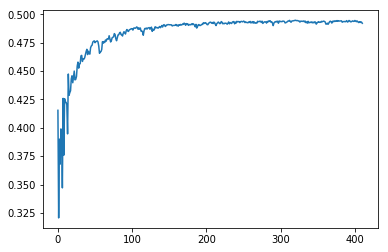

In [45]:
plt.plot(scores);

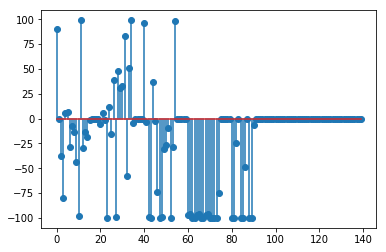

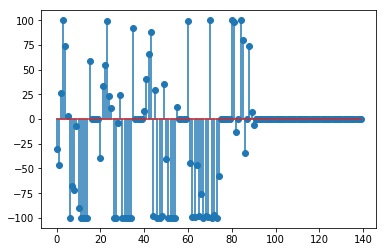

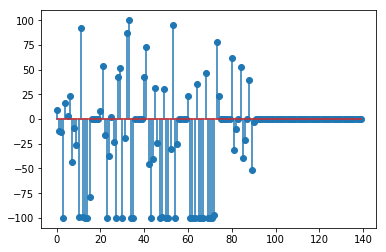

In [46]:
buvwx, buvwy, buvwz = T.reshape((3,-1))
plt.stem(buvwx);
plt.show();
plt.stem(buvwy);
plt.show();
plt.stem(buvwz);
plt.show();

# Draw results

In [47]:
local_params, centroid_m, centroid_f, xdim_m, ydim_m, zdim_m, xdim_f, ydim_f, zdim_f = \
(T, 
  aligner.centroid_m, aligner.centroid_f,
  aligner.xdim_m, aligner.ydim_m, aligner.zdim_m, 
  aligner.xdim_f, aligner.ydim_f, aligner.zdim_f)

Compute NuPx/NvPy/NwPz: 3.58 seconds.
Compute NuNvNw: 1.41 seconds.


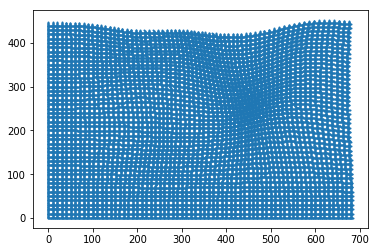

In [48]:
def return_gridline_points(xs, ys, w, h):
    grid_points = np.array([(x,y,120) for x in range(w) for y in ys] + [(x,y,120) for x in xs for y in range(h)])
    return grid_points

grid_points = return_gridline_points(range(0,volume_fixed[1].shape[1],10), 
                                     range(0,volume_fixed[1].shape[0],10), 
                                     volume_fixed[1].shape[1], 
                                     volume_fixed[1].shape[0])

warped_grid_points = transform_points_bspline(buvwx, buvwy, buvwz, 
                                              volume_shape=(xdim_m, ydim_m, zdim_m), interval=100, 
                                              pts=grid_points, c=centroid_m, c_prime=centroid_f)

# plt.figure(figsize=(10, 10));
plt.scatter(warped_grid_points[:,0], warped_grid_points[:,1], s=1)
plt.title('Deformation field @ z=120')
plt.show()

In [49]:
# local_params, centroid_m, centroid_f, xdim_m, ydim_m, zdim_m, xdim_f, ydim_f, zdim_f = \
# ([1,0,0,0,0,1,0,0,0,0,1,0], 
#   aligner.centroid_m, aligner.centroid_f,
#   aligner.xdim_m, aligner.ydim_m, aligner.zdim_m, 
#   aligner.xdim_f, aligner.ydim_f, aligner.zdim_f)

# Read global tx
# global_transformed_moving_structure_vols = \
# DataManager.load_transformed_volume_all_known_structures(stack_m=stack_moving, stack_f=stack_fixed,
#                                     classifier_setting_m=classifier_setting,
#                                     classifier_setting_f=classifier_setting,
#                                     warp_setting=upstream_warp_setting)

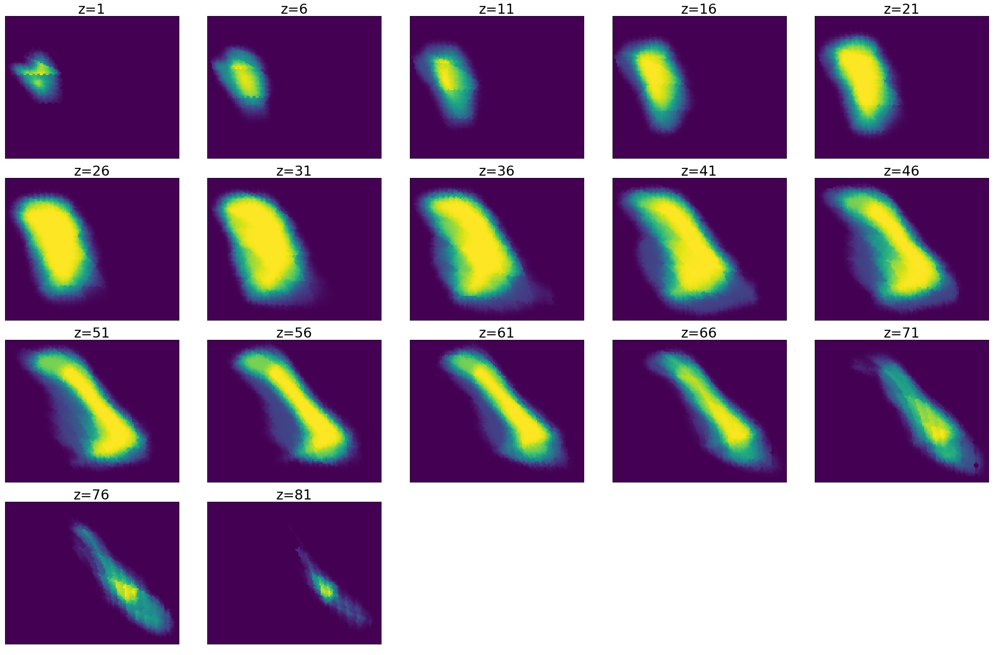

In [70]:
display_volume_sections(vols_m2f[structure_to_label_moving['Sp5C_L']].astype(np.float))

In [50]:
vols_m2f = {}
vols_m2f_bboxes = {}
vols_m2f_g = {}
vols_m2f_g_bboxes = {}

for ind_m, v in volume_moving.iteritems():

    vol_m2f_g_bbox = bbox_3d(v)
    vol_m2f_g_xmin, vol_m2f_g_xmax, vol_m2f_g_ymin, vol_m2f_g_ymax, vol_m2f_g_zmin, vol_m2f_g_zmax = vol_m2f_g_bbox
    vol_m2f_g = v[vol_m2f_g_ymin:vol_m2f_g_ymax+1, 
                                                        vol_m2f_g_xmin:vol_m2f_g_xmax+1,
                                                        vol_m2f_g_zmin:vol_m2f_g_zmax+1]
    
    vol_m2f, vol_m2f_bbox = \
    transform_volume_bspline((vol_m2f_g, vol_m2f_g_bbox), buvwx, buvwy, buvwz, 
                             volume_shape=(xdim_m, ydim_m, zdim_m), 
                             interval=100, 
                             centroid_m=centroid_m, centroid_f=centroid_f)
    
    vols_m2f[ind_m] = vol_m2f
    vols_m2f_bboxes[ind_m] = vol_m2f_bbox
    
    vols_m2f_g[ind_m] = vol_m2f_g
    vols_m2f_g_bboxes[ind_m] = vol_m2f_g_bbox

Compute NuPx/NvPy/NwPz: 3.79 seconds.
Compute NuNvNw: 1.58 seconds.
Compute NuPx/NvPy/NwPz: 4.12 seconds.
Compute NuNvNw: 1.57 seconds.
Compute NuPx/NvPy/NwPz: 0.24 seconds.
Compute NuNvNw: 0.10 seconds.
Compute NuPx/NvPy/NwPz: 0.25 seconds.
Compute NuNvNw: 0.10 seconds.
Compute NuPx/NvPy/NwPz: 6.71 seconds.
Compute NuNvNw: 2.66 seconds.
Compute NuPx/NvPy/NwPz: 7.27 seconds.
Compute NuNvNw: 2.67 seconds.
Compute NuPx/NvPy/NwPz: 3.86 seconds.
Compute NuNvNw: 1.58 seconds.
Compute NuPx/NvPy/NwPz: 4.12 seconds.
Compute NuNvNw: 1.60 seconds.
Compute NuPx/NvPy/NwPz: 0.47 seconds.
Compute NuNvNw: 0.18 seconds.
Compute NuPx/NvPy/NwPz: 0.49 seconds.
Compute NuNvNw: 0.18 seconds.
Compute NuPx/NvPy/NwPz: 4.92 seconds.
Compute NuNvNw: 2.00 seconds.
Compute NuPx/NvPy/NwPz: 5.07 seconds.
Compute NuNvNw: 1.99 seconds.
Compute NuPx/NvPy/NwPz: 13.97 seconds.
Compute NuNvNw: 5.43 seconds.
Compute NuPx/NvPy/NwPz: 14.88 seconds.
Compute NuNvNw: 5.43 seconds.
Compute NuPx/NvPy/NwPz: 10.15 seconds.
Compute

In [51]:
# Set colors for different contour level
levels = [0.1, 0.25, 0.5, 0.75, .99]
# levels = [0.5]
level_colors = {level: (int(level*255),0,0) for level in levels}
level_colors2 = {level: (0,int(level*255),0) for level in levels}

0 684 0 447 100 496
233


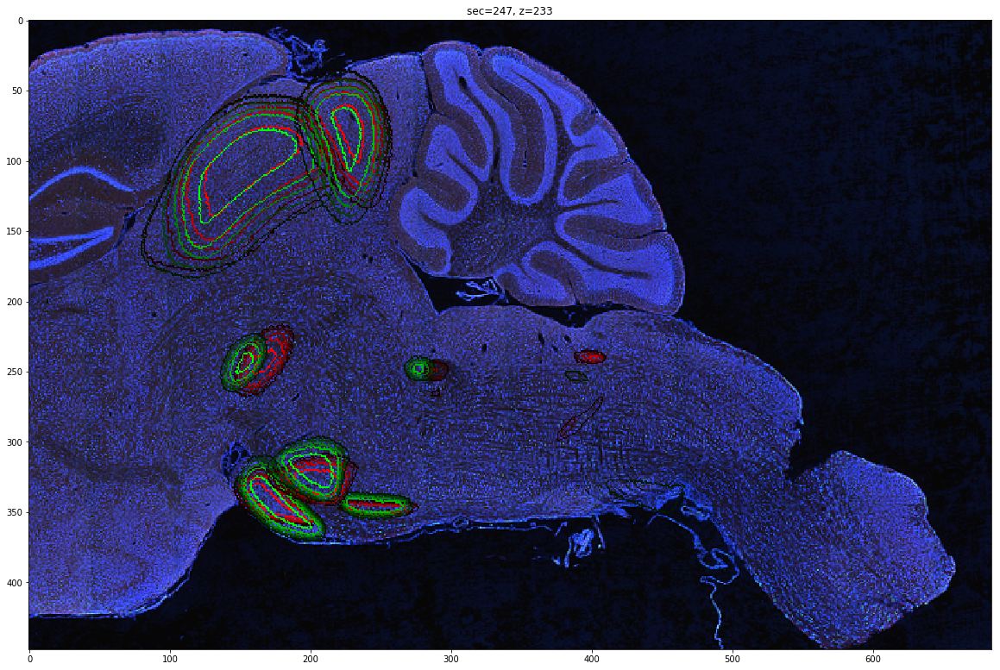

240


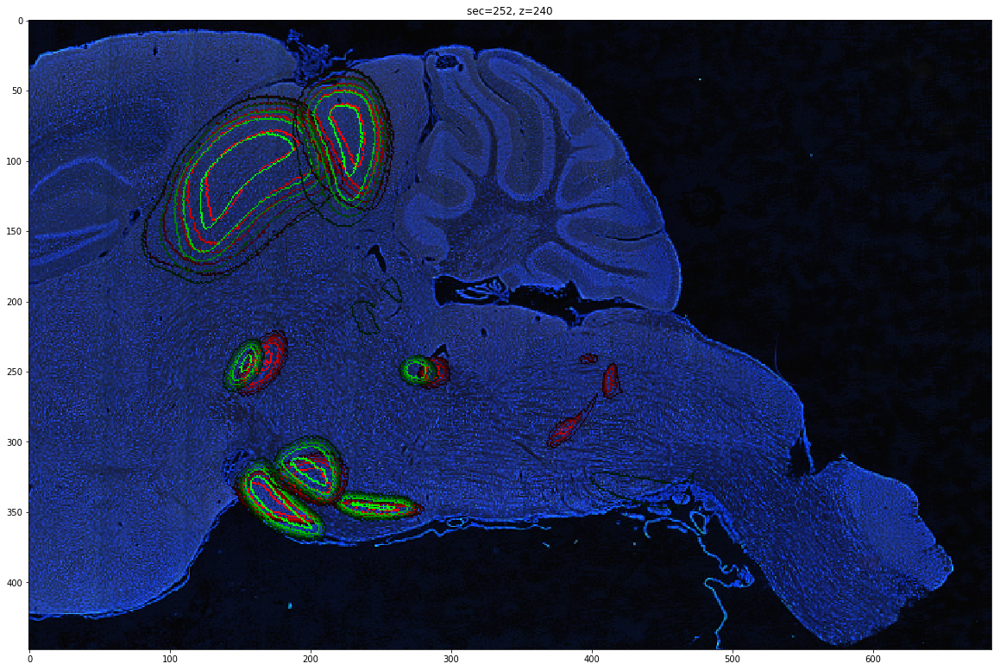

247


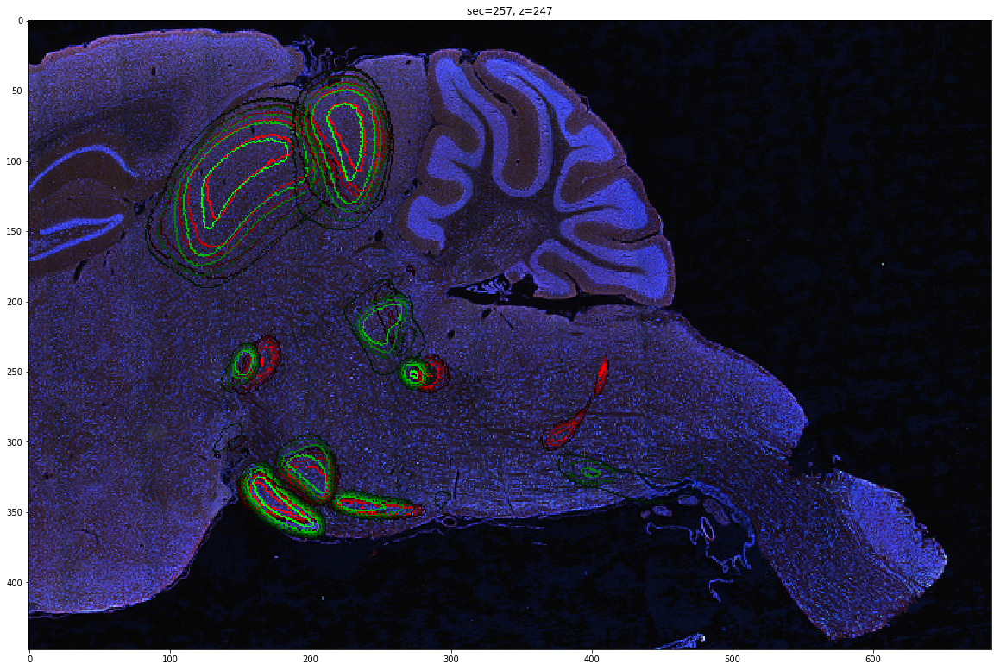

254


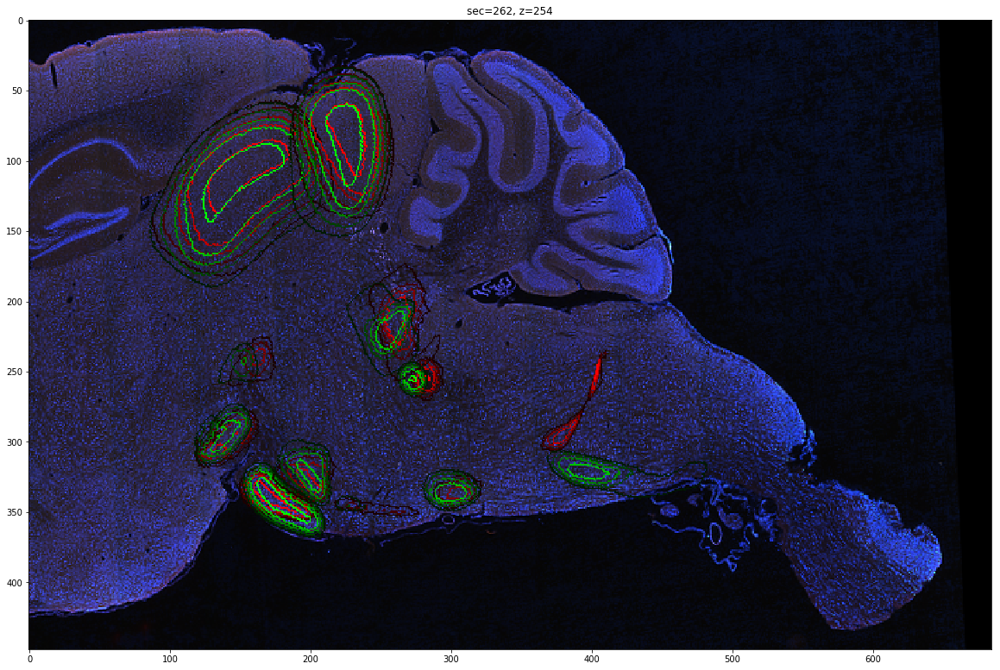

260


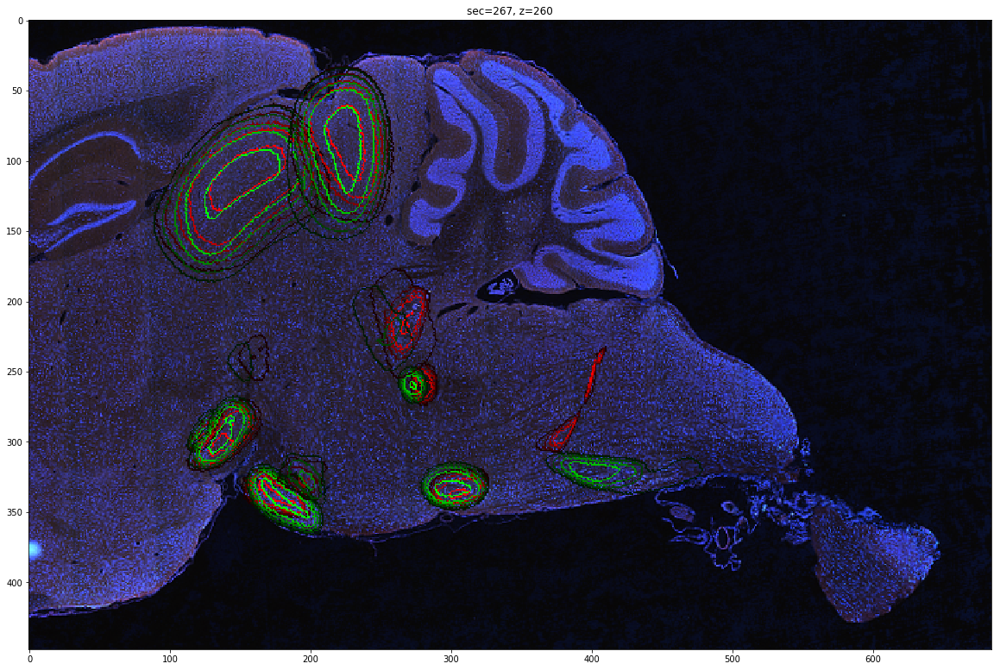

267


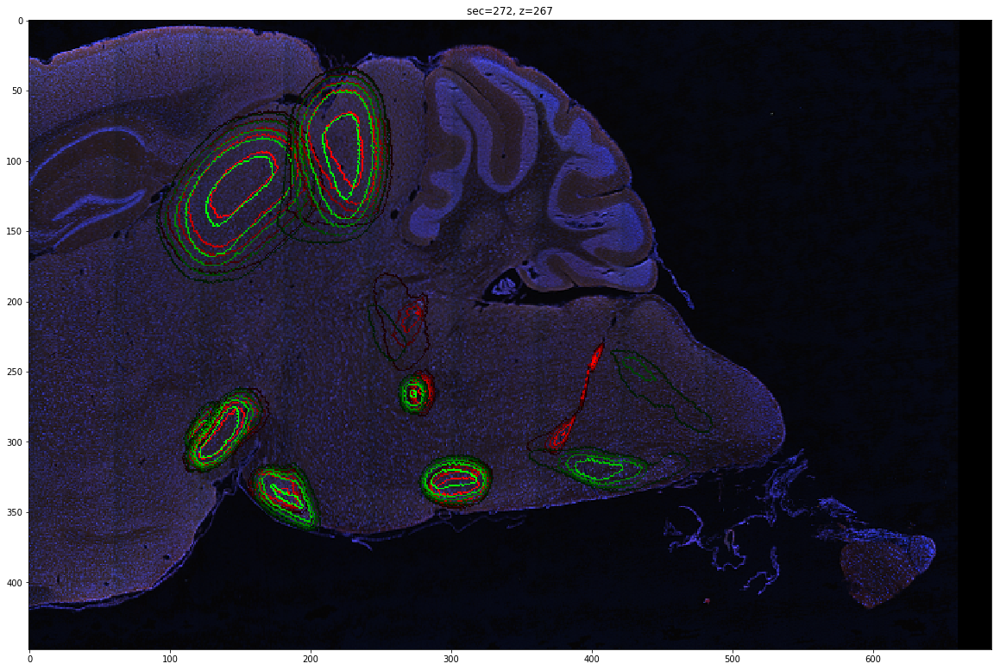

274


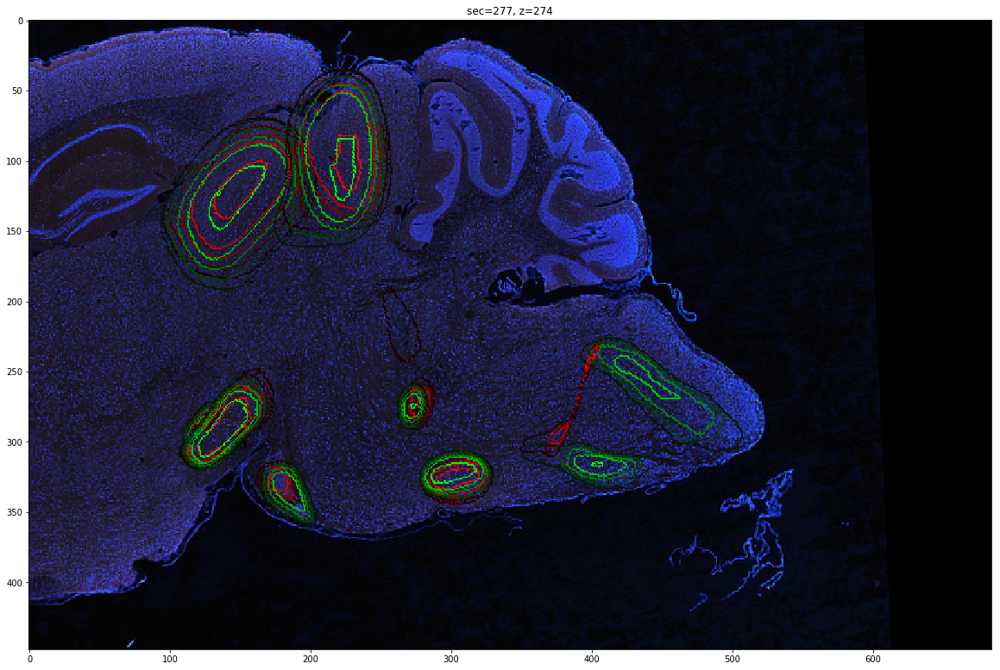

281


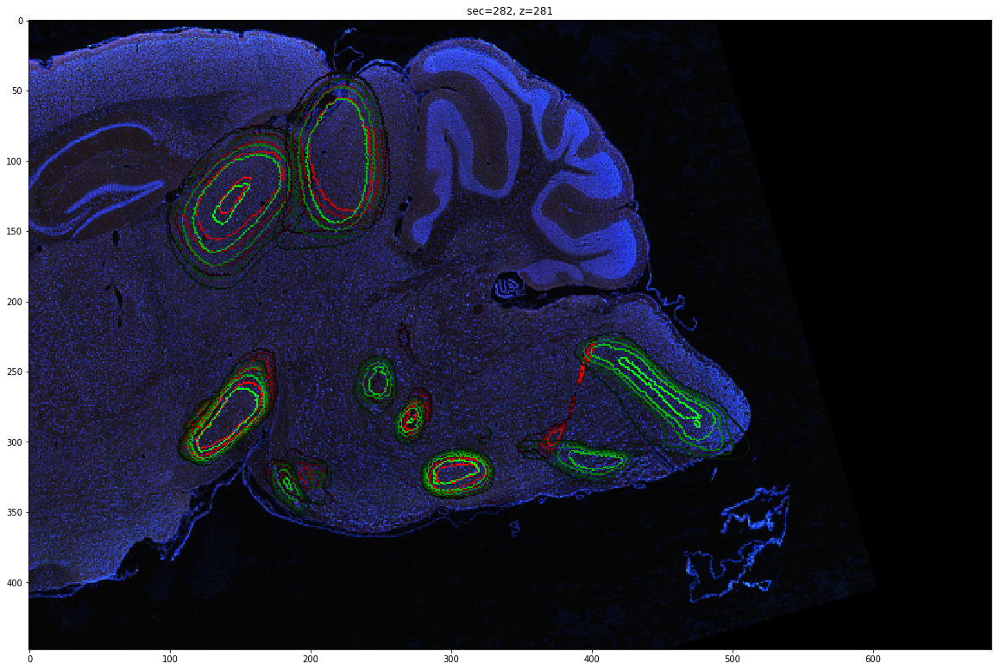

288


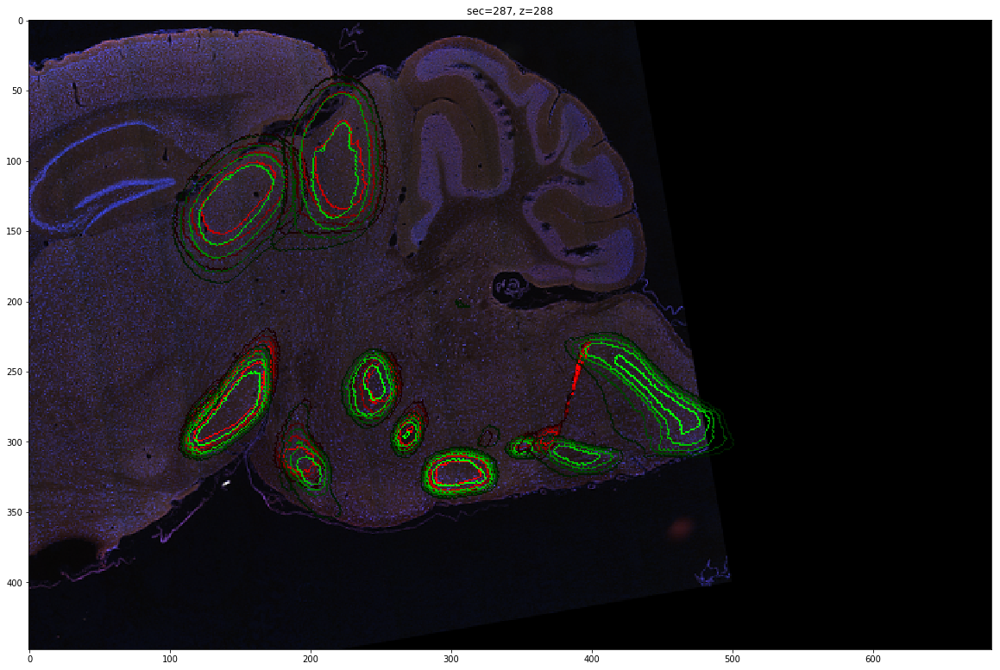

294


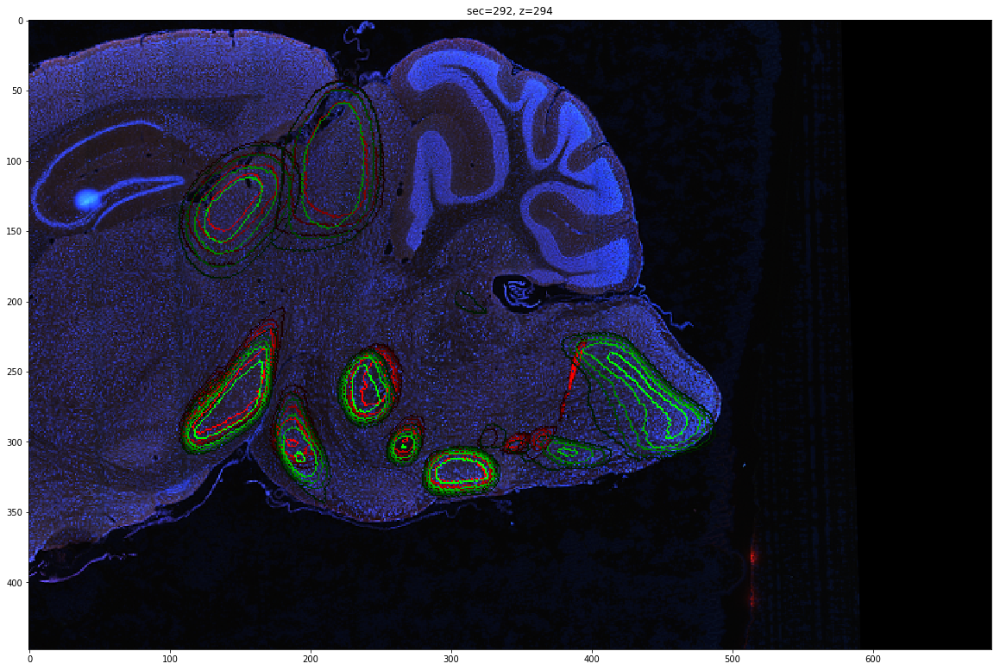

301


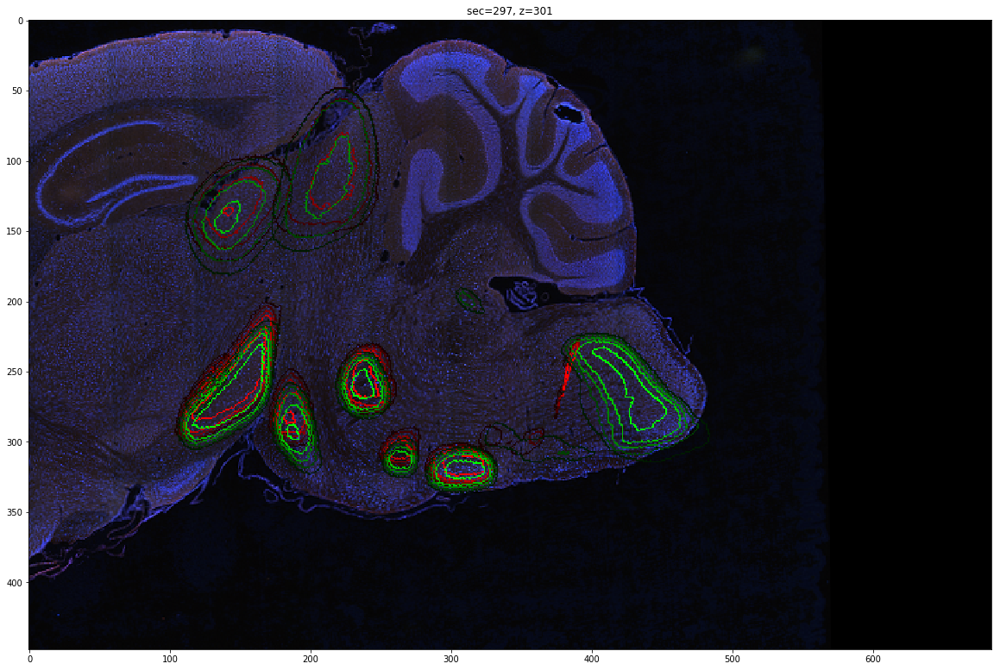

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F121-2016.05.20-01.55.48_MD635_1_0361_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F121-2016.05.20-01.55.48_MD635_1_0361_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F121-2016.05.20-01.55.48_MD635_1_0361_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
308


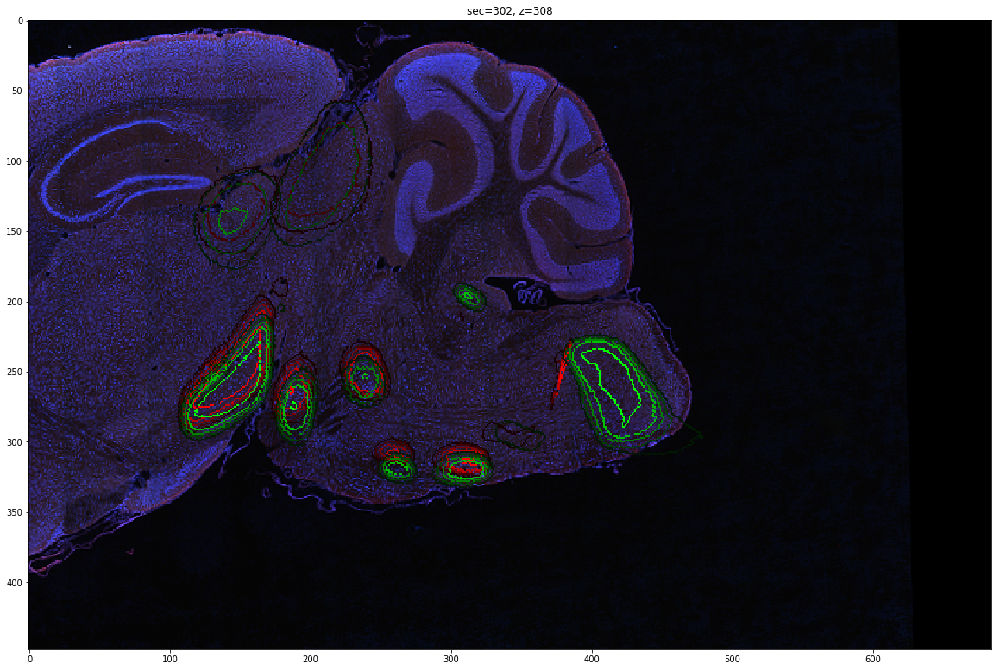

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F122-2016.05.20-12.43.46_MD635_3_0366_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F122-2016.05.20-12.43.46_MD635_3_0366_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F122-2016.05.20-12.43.46_MD635_3_0366_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
315


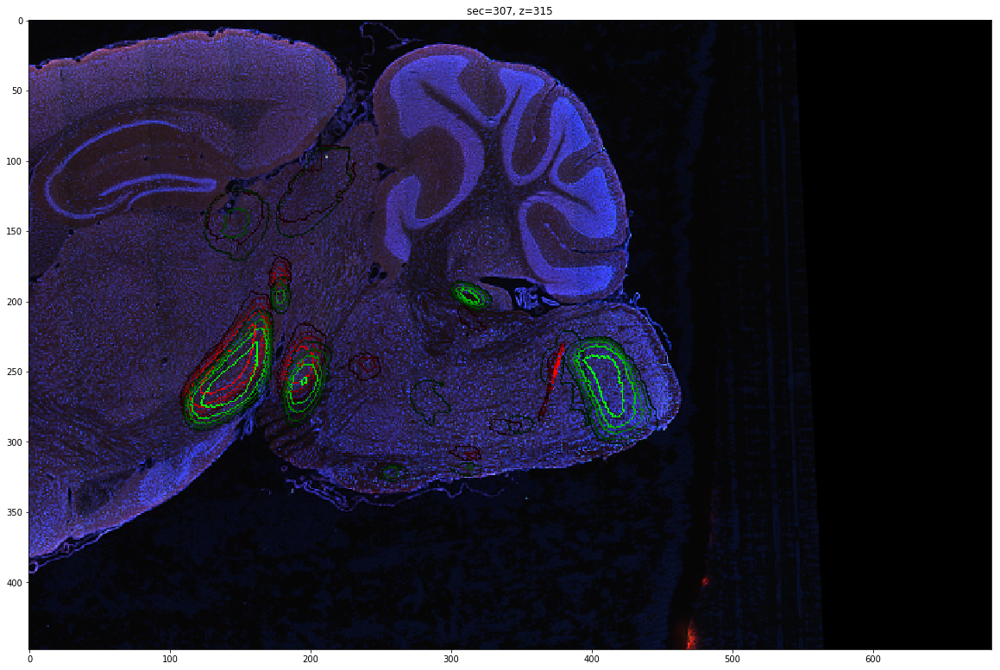

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F124-2016.05.20-02.13.16_MD635_2_0371_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F124-2016.05.20-02.13.16_MD635_2_0371_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F124-2016.05.20-02.13.16_MD635_2_0371_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
322


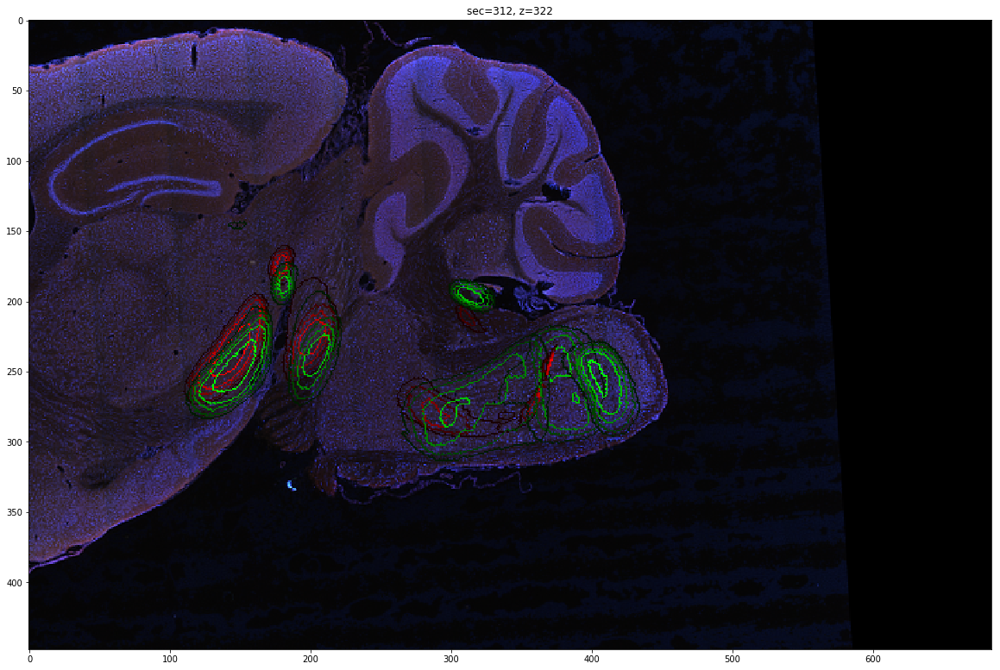

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F126-2016.05.20-02.44.24_MD635_1_0376_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F126-2016.05.20-02.44.24_MD635_1_0376_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F126-2016.05.20-02.44.24_MD635_1_0376_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
328


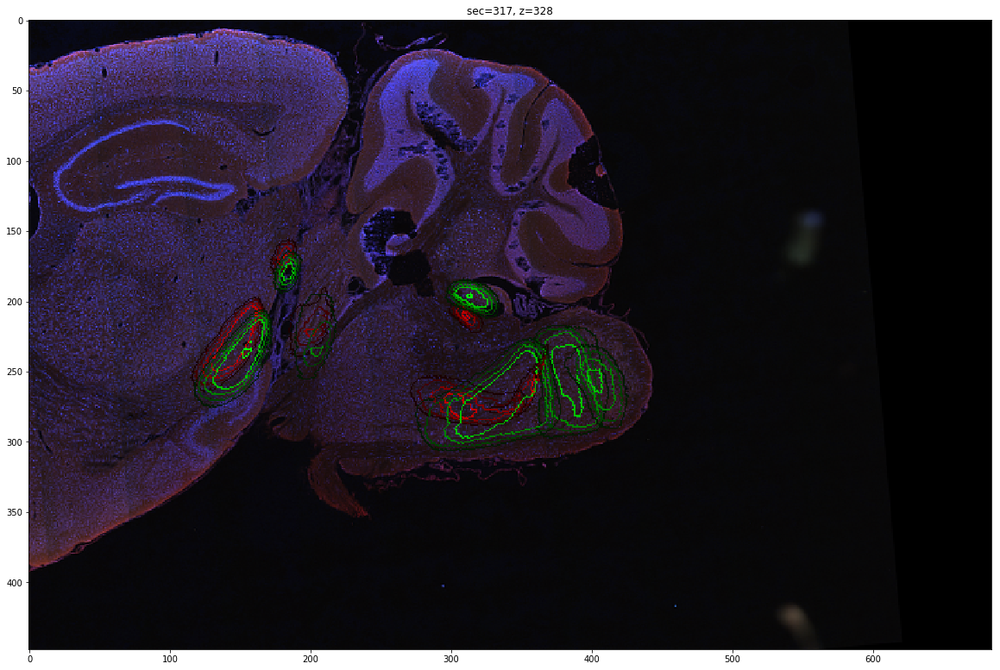

rm -rf /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F127-2016.05.20-02.59.46_MD635_3_0381_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif && mkdir -p /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped
aws s3 cp s3://mousebrainatlas-data/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F127-2016.05.20-02.59.46_MD635_3_0381_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif /shared/CSHL_data_processed/MD635/MD635_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped/MD635-F127-2016.05.20-02.59.46_MD635_3_0381_thumbnail_alignedTo_MD635-F63-2016.05.19-08.39.03_MD635_2_0188_cropped.tif
335


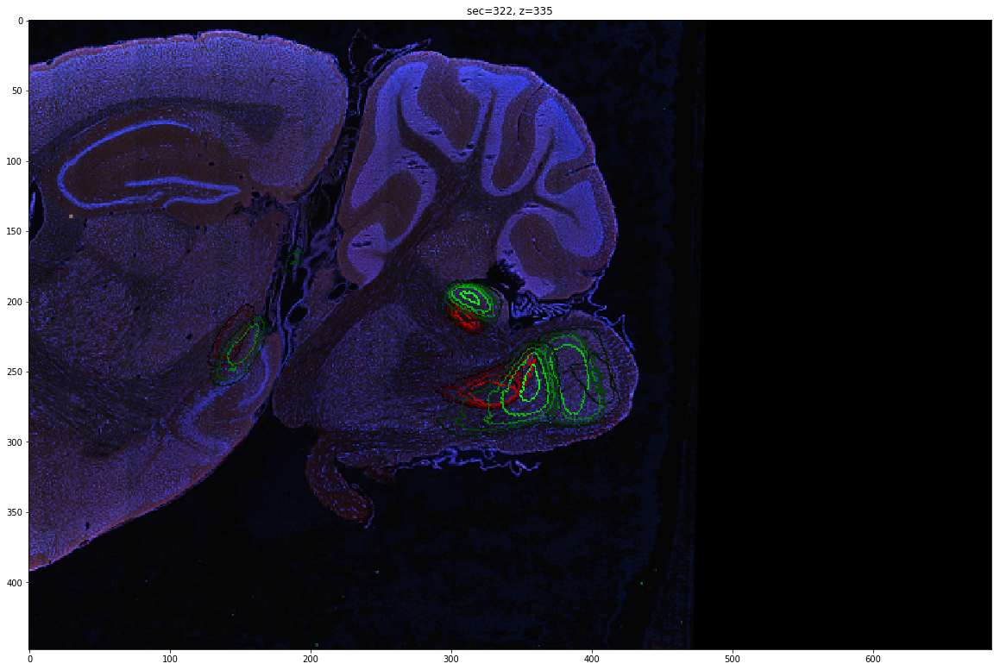

In [66]:
# Generate overlay visualization

# estimate mapping between z and section
# downsample_factor = 32
# xy_pixel_distance_downsampled = XY_PIXEL_DISTANCE_LOSSLESS * downsample_factor
# voxel_z_size = SECTION_THICKNESS / xy_pixel_distance_downsampled

# For getting correct contour location
xmin_vol_f, xmax_vol_f, ymin_vol_f, ymax_vol_f, zmin_vol_f, zmax_vol_f = \
DataManager.load_original_volume_bbox(stack=stack_fixed, vol_type='score', structure='7N', 
                             downscale=32, classifier_setting=classifier_setting)
print xmin_vol_f, xmax_vol_f, ymin_vol_f, ymax_vol_f, zmin_vol_f, zmax_vol_f

# Generate atlas overlay image for every section

zf, zl = vols_m2f_bboxes[structure_to_label_moving['Sp5C_R']][4:]
sec_first = DataManager.convert_z_to_section(stack=stack_fixed, z=zf, downsample=32)
sec_last = DataManager.convert_z_to_section(stack=stack_fixed, z=zl, downsample=32)

for sec in range(sec_first, sec_last+1, 5):
# for sec in [181]:

    if is_invalid(stack=stack_fixed, sec=sec):
        continue

    try:
        img = DataManager.load_image(stack=stack_fixed, section=sec, resol='thumbnail', version='cropped_tif')
#         sc_viz_fp = DataManager.get_scoremap_viz_filepath(stack=stack_fixed, section=sec, 
#                                                            downscale=32,
#                                                            structure=convert_to_original_name('7N_L'), 
#                                                            classifier_id=classifier_setting)
#         download_from_s3(sc_viz_fp)
#         img = imread(sc_viz_fp)
    except:
        sys.stderr.write('Error loading scoremap for section %d\n' % sec)
        continue

#     img = img[::4, ::4]

    viz = img.copy()

    z1, z2 = DataManager.convert_section_to_z(stack=stack_fixed, sec=sec, downsample=32)
    z = int(z1)
    print z
         
    # Find moving volume annotation contours
    
    for ind_m in vols_m2f.keys():
        if ind_m != 
        vol_m2f = vols_m2f[ind_m]
        vol_m2f_bbox = vols_m2f_bboxes[ind_m]
        vol_m2f_g = vols_m2f_g[ind_m]
        vol_m2f_g_bbox = vols_m2f_g_bboxes[ind_m]
        
        if z >= vol_m2f_bbox[4] and z < vol_m2f_bbox[4] + vol_m2f.shape[2]:

            c = 0
            for level in levels:
                cnts = find_contours(vol_m2f[..., z - vol_m2f_bbox[4]], level=level) # rows, cols
                c += len(cnts)
                for cnt in cnts:
                    # r,c to x,y
                    cnt_on_cropped = cnt[:,::-1] + (xmin_vol_f, ymin_vol_f) + (vol_m2f_bbox[0], vol_m2f_bbox[2])
                    cv2.polylines(viz, [cnt_on_cropped.astype(np.int)], True, level_colors[level], 1)
            
        if z >= vol_m2f_g_bbox[4] and z < vol_m2f_g_bbox[4] + vol_m2f_g.shape[2]:
                    
            for level in levels:
                cnts = find_contours(vol_m2f_g[..., z - vol_m2f_g_bbox[4]], level=level) # rows, cols
                c += len(cnts)
                for cnt in cnts:
                    # r,c to x,y
                    cnt_on_cropped = cnt[:,::-1] + (xmin_vol_f, ymin_vol_f) + (vol_m2f_g_bbox[0], vol_m2f_g_bbox[2])
                    cv2.polylines(viz, [cnt_on_cropped.astype(np.int)], True, level_colors2[level], 1)

    if c > 0:    
        plt.figure(figsize=(20, 20));
        plt.title("sec=%d, z=%d" % (sec, z));
        plt.imshow(viz);
        plt.show();